Imports

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

from sqlalchemy import create_engine
from scipy import stats

In [2]:
db = 'ign_naturstyrelsen'
user = 'edin'
password = ''
host = '10.0.1.30'

connection_string = f'postgresql+psycopg2://{user}:{password}@{host}/{db}'

con = create_engine(connection_string)

In [3]:
def query_station(station_id, temporal_resolution='hour'):

    if station_id.startswith('onehour_'):    
        datetime_format_str = "DD/MM YYYY. HH24:MI:SS"
    elif station_id.startswith('eco_'):
        datetime_format_str = "mon DD, YYYY HH12:MI AM"

    q_stmt = f"""select date_trunc('{temporal_resolution}', TO_TIMESTAMP(datetime, '{datetime_format_str}')) as time, sum(count) as station_count
         from {station_id} 
         where datetime is not null and count is not null
         group by date_trunc('{temporal_resolution}', TO_TIMESTAMP(datetime, '{datetime_format_str}'))
         order by date_trunc('{temporal_resolution}', TO_TIMESTAMP(datetime, '{datetime_format_str}')) 
      """
    df = pd.read_sql(q_stmt, con)
    return(df)

In [4]:
def query_raw_data(t_start, t_end, station_lat=12.3109056, station_lon=55.9641755, radius=50, temporal_resolution='hour'):
    q_stmt = f""" select date_trunc('{temporal_resolution}', ts) as time, count(point_id) as gps_count
                 from raw_data
                 where ST_DWITHIN(ST_MakePoint(longitude_d, latitude_d):: geography, 
                                  ST_MakePoint({station_lon}, {station_lat}):: geography,{radius})
                 and ts BETWEEN '{t_start}' AND '{t_end}'                
                 group by date_trunc('{temporal_resolution}', ts)
                 order by date_trunc('{temporal_resolution}', ts)
    """
    df = pd.read_sql(q_stmt, con)
    return(df)


In [5]:
def query_raw_routes(t_start, t_end, station_lat=12.3109056, station_lon=55.9641755, radius=50, temporal_resolution='hour'):
    q_stmt = f""" select date_trunc('{temporal_resolution}', t_start) as time, count(route_id) as gps_count
                 from route r
                 where ST_DWITHIN(r.geom:: geography, 
                                  ST_MakePoint({station_lon}, {station_lat}):: geography,{radius})
                 and t_start BETWEEN '{t_start}' AND '{t_end}'                
                 group by date_trunc('{temporal_resolution}', t_start)
                 order by date_trunc('{temporal_resolution}', t_start)
    """
    df = pd.read_sql(q_stmt, con)
    return(df)


In [6]:
def query_clean_routes(t_start, t_end, station_lat=12.3109056, station_lon=55.9641755, radius=50, temporal_resolution='hour'):
    q_stmt = f""" select date_trunc('{temporal_resolution}', t_start) as time, count(route_id) as gps_count
                 from far_from_infra ffi
                 where ST_DWITHIN(ffi.geom:: geography, 
                                  ST_MakePoint({station_lon}, {station_lat}):: geography,{radius})
                 and t_start BETWEEN '{t_start}' AND '{t_end}'                
                 group by date_trunc('{temporal_resolution}', t_start)
                 order by date_trunc('{temporal_resolution}', t_start)
    """
    df = pd.read_sql(q_stmt, con)
    return(df)


In [7]:
def get_and_merge_data(query_func, temporal_resolution, radius, station_id):
    df_station = query_station(station_id, temporal_resolution=temporal_resolution)

    t_start = df_station.time.min().strftime('%Y-%m-%d %X')
    t_end = df_station.time.max().strftime('%Y-%m-%d %X')
    
    lat = station_locations[station_id]['lat']
    lon = station_locations[station_id]['lon']

    df_gps = query_func(t_start, t_end, station_lat=lat, station_lon=lon, radius=radius, temporal_resolution=temporal_resolution)

    df_gps['time'] = pd.to_datetime(df_gps['time'], utc = True)

    df_station = df_station[(df_station.time > df_gps.time.min())&(df_station.time < df_gps.time.max())]

    df = pd.merge(df_gps,df_station, how="right", on="time")
    df.fillna(int(0), inplace=True)
    
    return(df)

In [8]:
def do_regression(query_func, temporal_resolution, radius, station_id):    

    df = get_and_merge_data(query_func, temporal_resolution, radius, station_id)
    
    try:
        slope, intercept, r_value, p_value, std_err = stats.linregress(df["station_count"], df["gps_count"])
    except ValueError:
        r_value = 0
    
    return(r_value**2)  

#r2 = do_regression(query_raw_routes, 'day', 50, 'onehour_302775')

In [9]:
def plot_correlation(query_func, station_id, temporal_resolution, radius):

    df = get_and_merge_data(query_func, temporal_resolution, radius, station_id)
    
    slope, intercept, r_value, p_value, std_err = stats.linregress(df["station_count"], df["gps_count"])

    fig = px.scatter(df, x="station_count", y="gps_count")
    #fig = px.line(df, x="time", y="antal")
    fig.add_scatter(x=df['station_count'], y=intercept + slope*df['station_count'], mode='lines', hovertext=df['gps_count'], hoverinfo="text",name='bedste fit')
    fig.show()

In [10]:
def plot_timeseries(query_func, station_id, temporal_resolution, radius):

    df = get_and_merge_data(query_func, temporal_resolution, radius, station_id)

    fig = px.line(df, x="time", y="station_count")
    #fig = px.line(df, x="time", y="antal")
    fig.add_scatter(x=df['time'], y=df['gps_count'], mode='lines', hovertext=df['gps_count'], hoverinfo="text",name='gps data')
    fig.show()

In [11]:
def make_plots(station_id, query_func):
    print(f'station: {station_id}')
    results = []
    for dx in spatial_resolutions:
        for dt in temporal_resolutions:    
            r_squared = do_regression(query_func, dt, dx, station_id=station_id)
            results.append({'dt': str(dt), 'dx': str(dx), 'r_squared': r_squared})
    df = pd.DataFrame(results)
    df = df.pivot("dx", "dt", "r_squared")
    
    fig = px.imshow(df[temporal_resolutions].loc[[str(i) for i in spatial_resolutions]])
    
    fig.show()    

    best_dx, best_dt = df.stack().idxmax()
    plot_timeseries(query_func, station_id, best_dt, best_dx)
    plot_correlation(query_func, station_id, best_dt, best_dx)
    
    
    

In [12]:
station_locations = {'onehour_32ed06': {'lat': 55.9641755, 'lon': 12.3109056},
                     'onehour_302775': {'lat': 55.99425445, 'lon': 12.35565572},
                     'onehour_30289c': {'lat': 55.95622582, 'lon': 12.34694014},
                     'onehour_355853': {'lat': 56.00047168, 'lon': 12.30452845},
                     'onehour_3812a4': {'lat': 56.022677, 'lon': 12.222292},
                     'eco_egehjorten': {'lat': 55.958153, 'lon': 12.356097},
                     #'eco_overdrevsvej': {'lat': 55.92656, 'lon': 12.34142}, # ikke nok overlappende data
                     'eco_praestevang': {'lat': 55.919976, 'lon': 12.324700}}

temporal_resolutions = ['hour', 'day', 'week', 'month']

spatial_resolutions = [50, 500, 1000, 2000]


#temporal_resolutions = ['week', 'month']

#spatial_resolutions = [1000, 2000]


# Rådata

station: onehour_32ed06


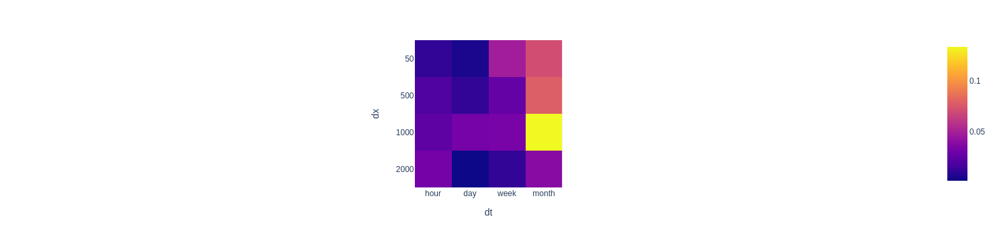

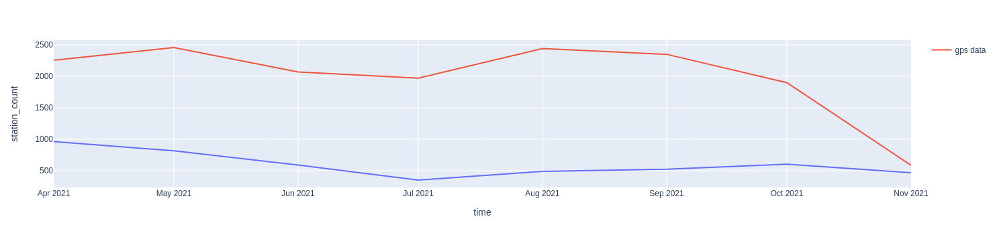

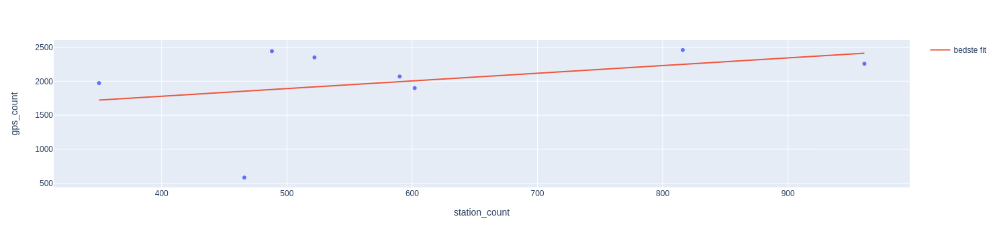

In [13]:
make_plots('onehour_32ed06', query_raw_data)

station: onehour_302775


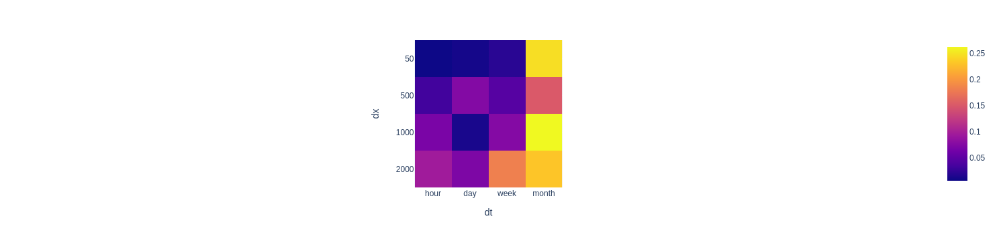

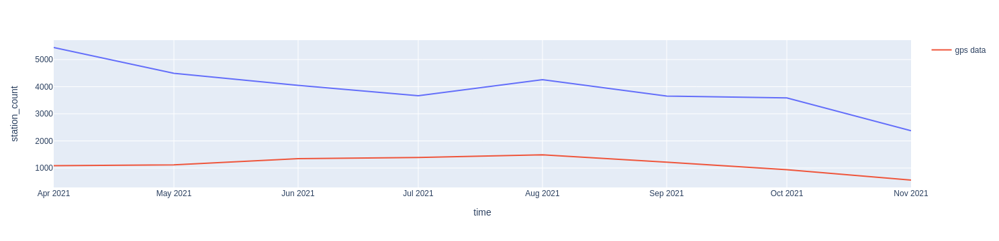

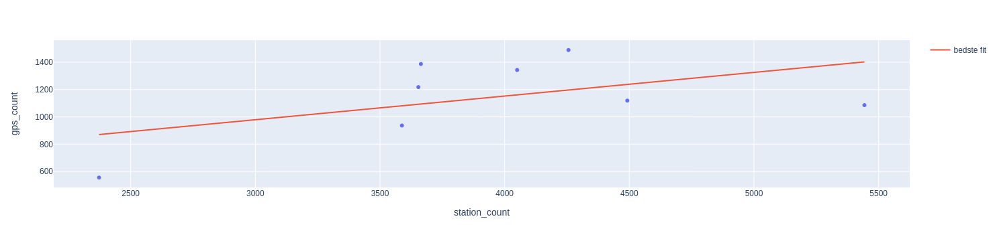

In [14]:
make_plots('onehour_302775', query_raw_data)

station: onehour_30289c


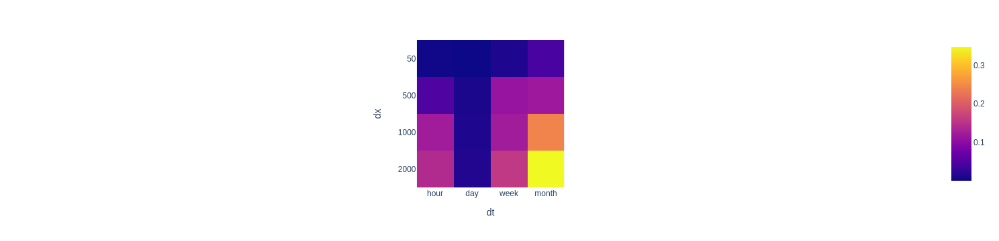

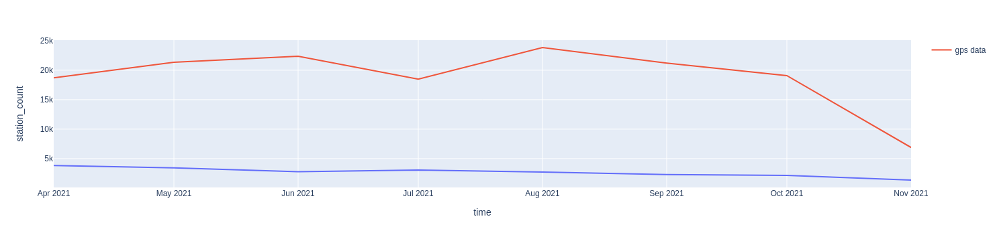

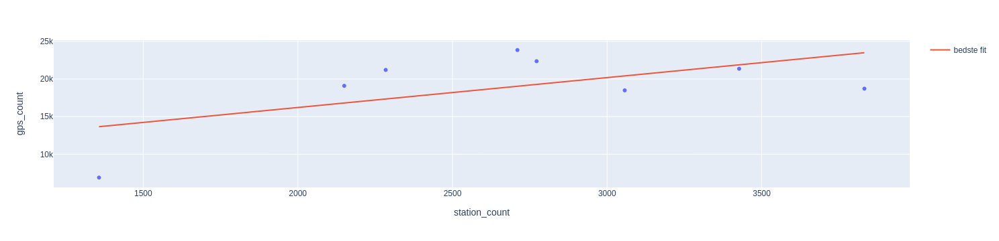

In [15]:
make_plots('onehour_30289c', query_raw_data)

station: onehour_355853


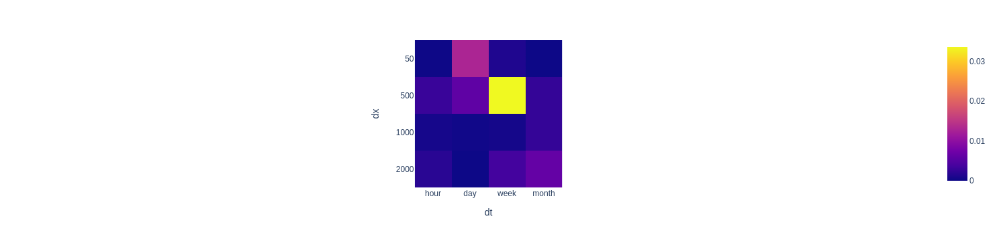

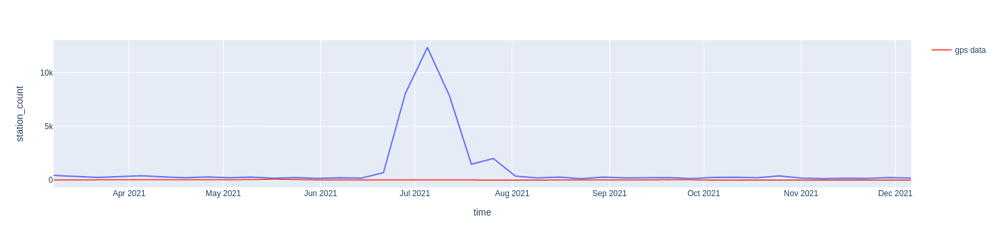

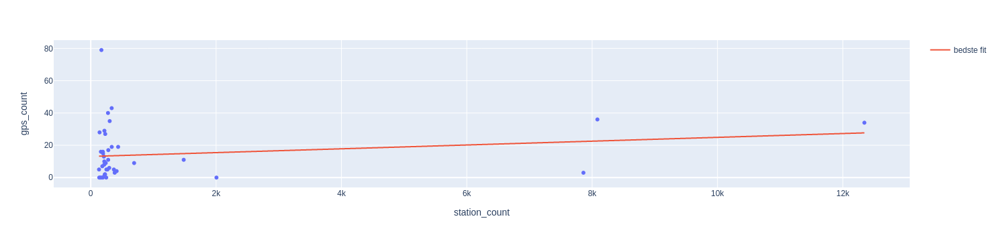

In [16]:
make_plots('onehour_355853', query_raw_data)

station: onehour_3812a4


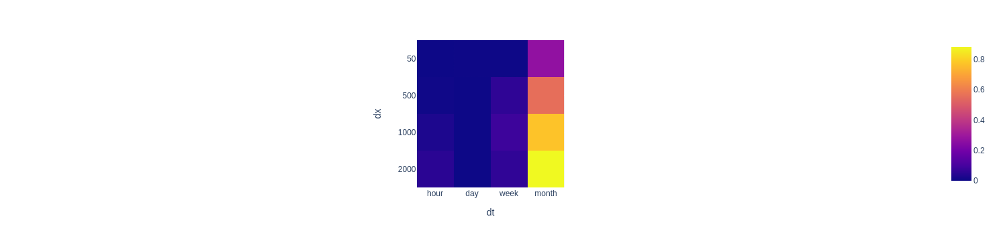

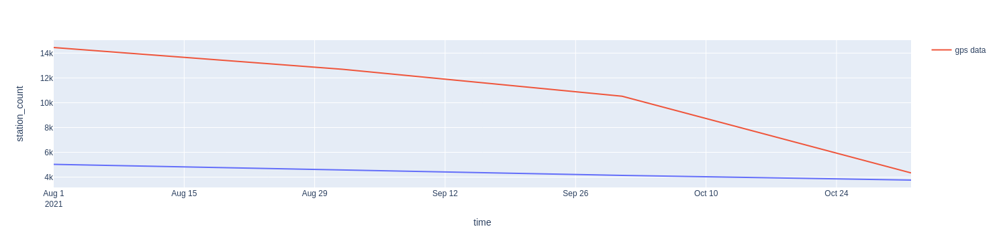

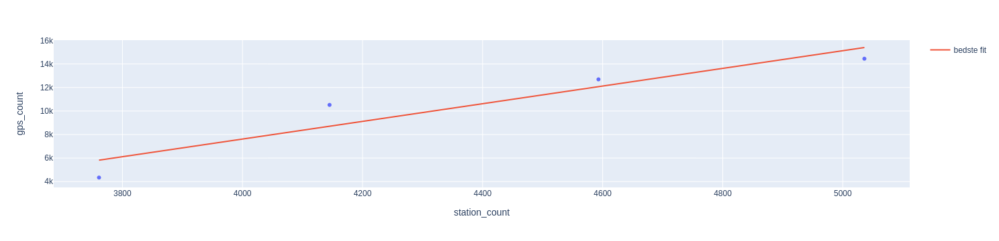

In [17]:
make_plots('onehour_3812a4', query_raw_data)

station: eco_egehjorten


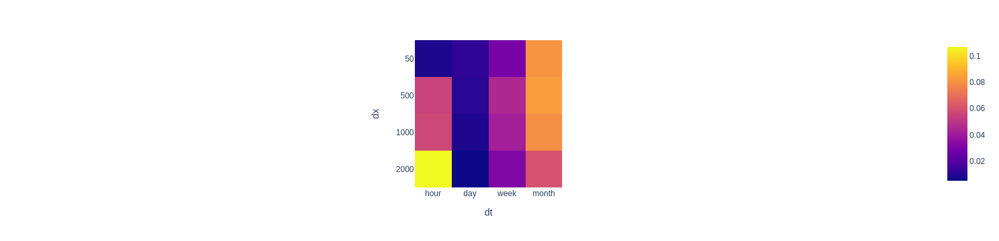

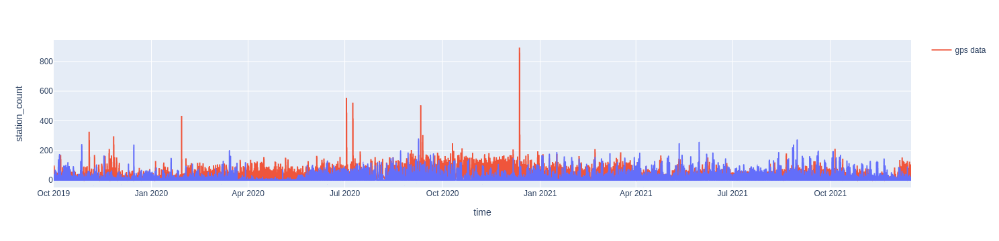

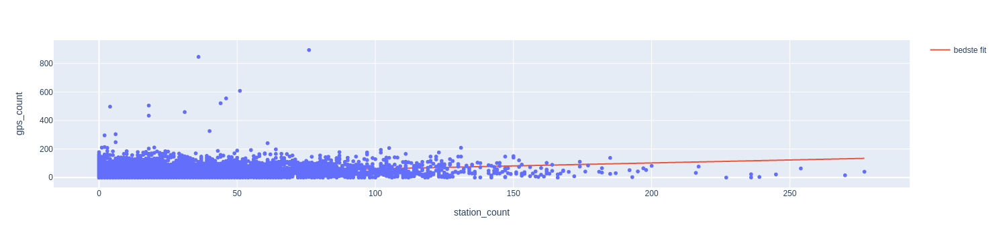

In [18]:
make_plots('eco_egehjorten', query_raw_data)

station: eco_praestevang


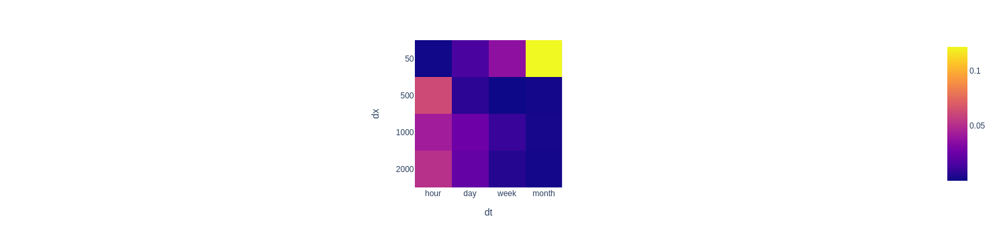

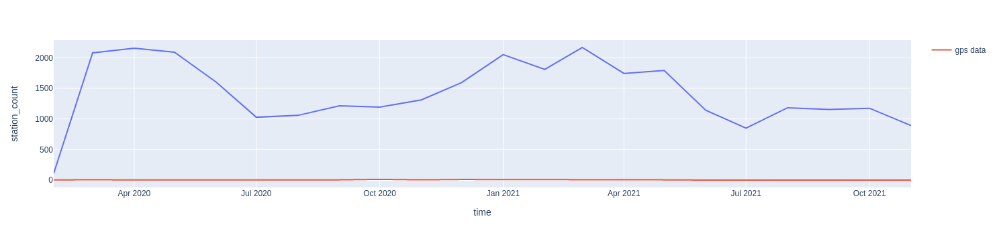

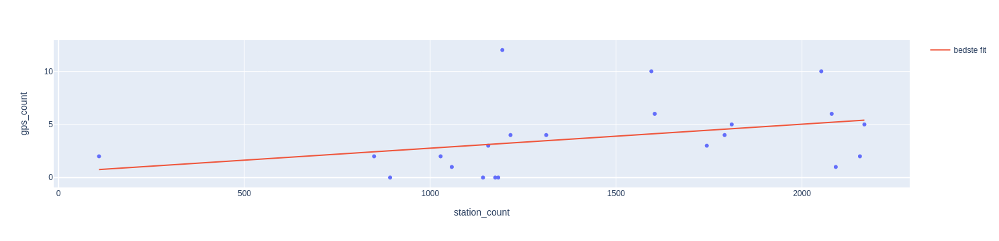

In [19]:
make_plots('eco_praestevang', query_raw_data)

# Rå ruter

station: onehour_32ed06


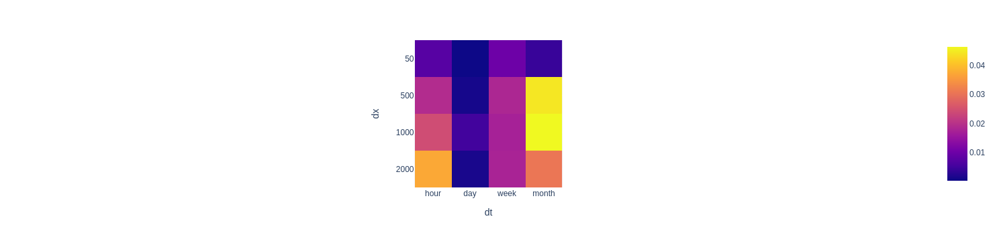

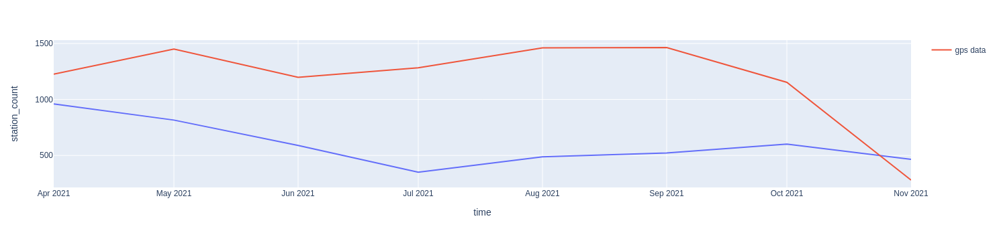

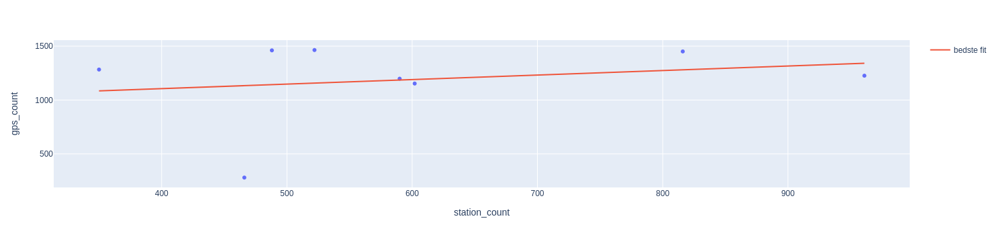

In [20]:
make_plots('onehour_32ed06', query_raw_routes)

station: onehour_302775


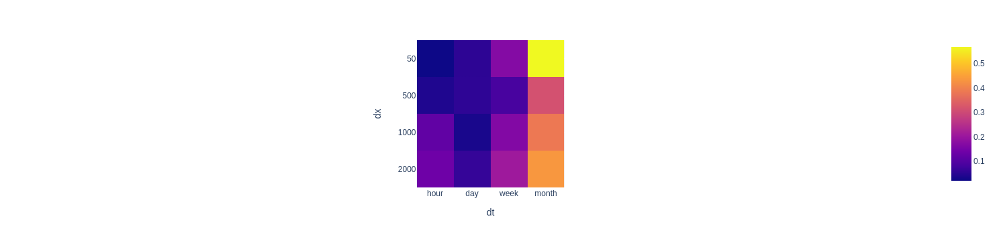

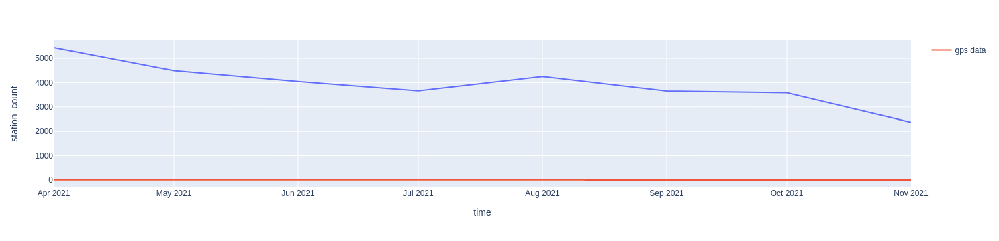

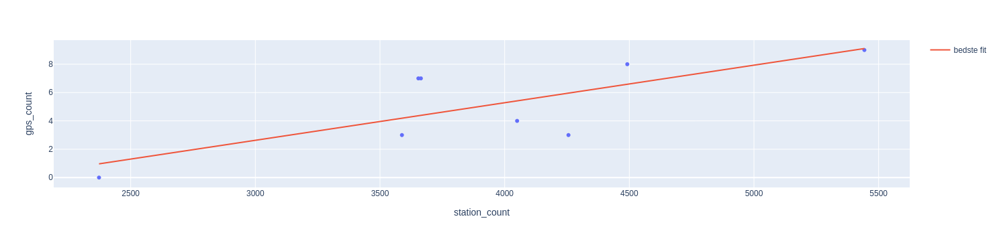

In [21]:
make_plots('onehour_302775', query_raw_routes)

station: onehour_30289c


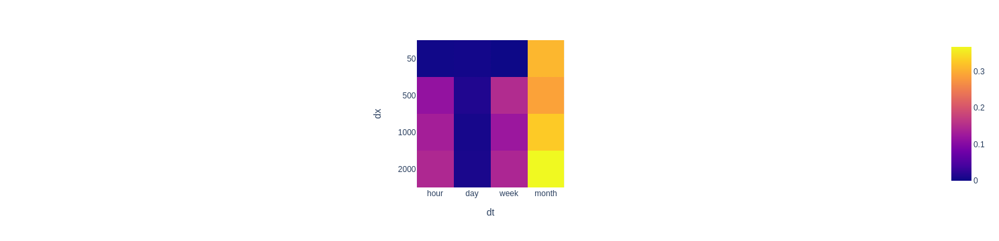

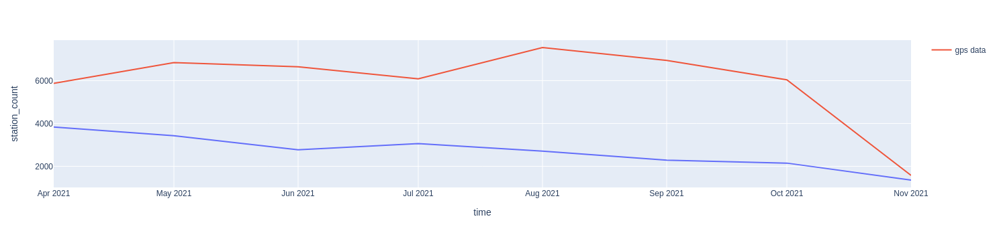

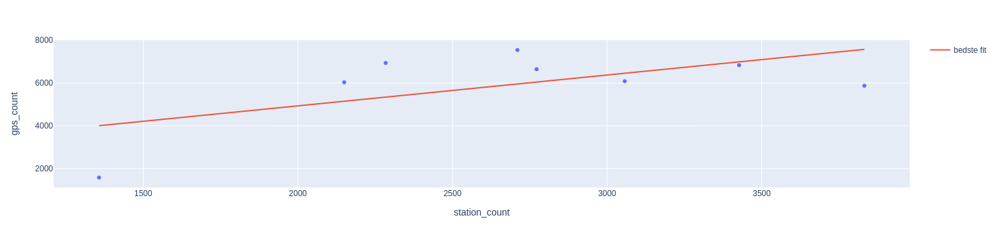

In [22]:
make_plots('onehour_30289c', query_raw_routes)

station: onehour_355853


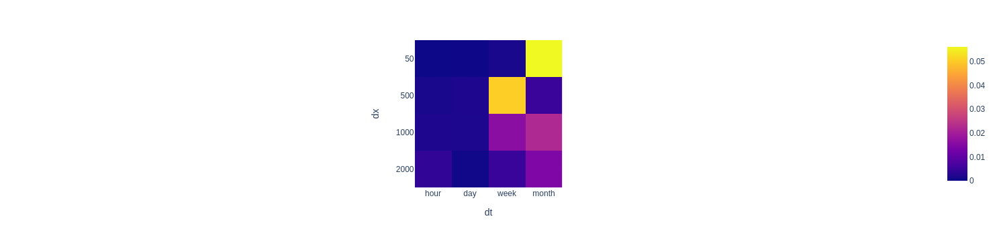

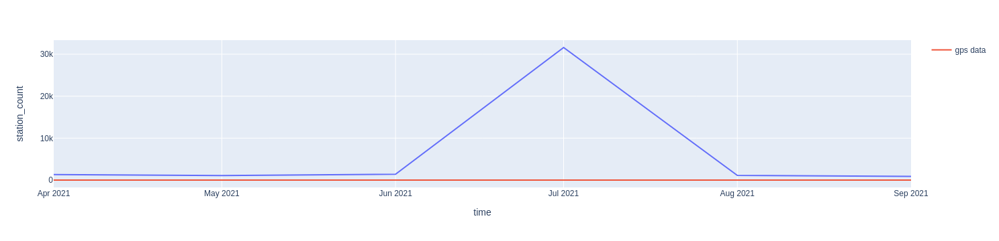

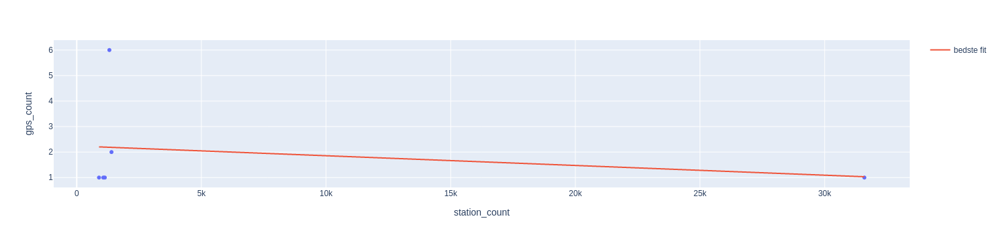

In [23]:
make_plots('onehour_355853', query_raw_routes)

station: onehour_3812a4


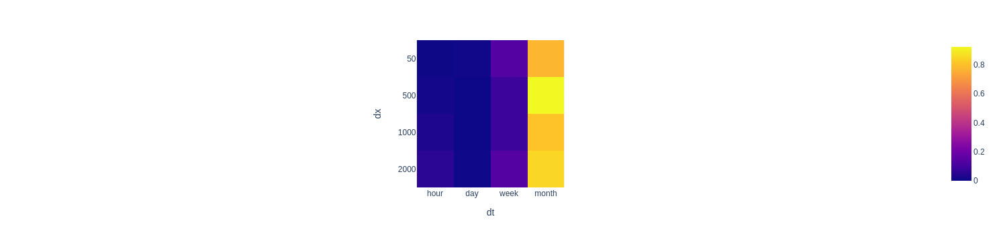

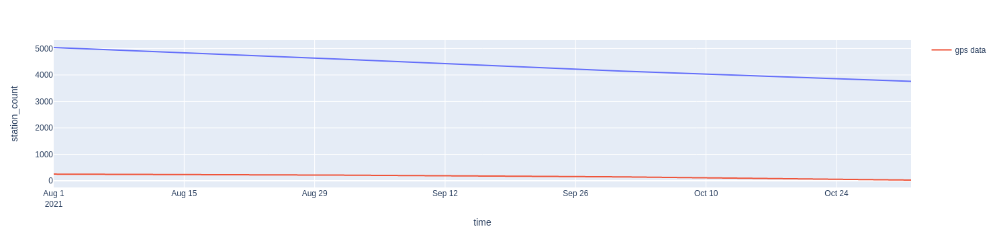

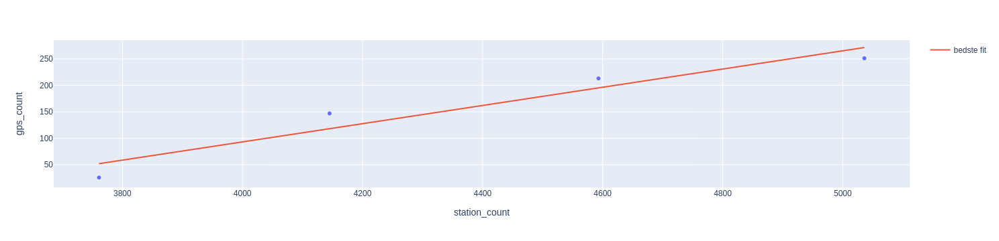

In [24]:
make_plots('onehour_3812a4', query_raw_routes)

station: eco_egehjorten


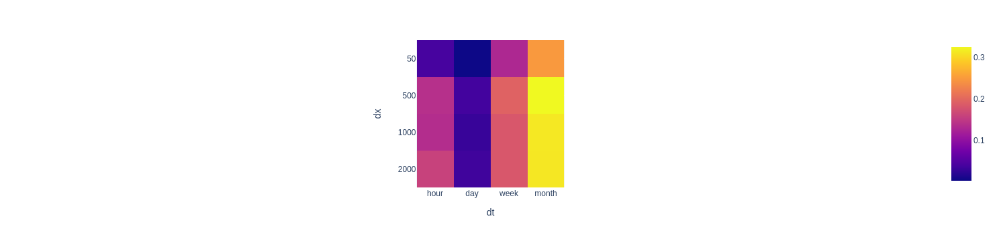

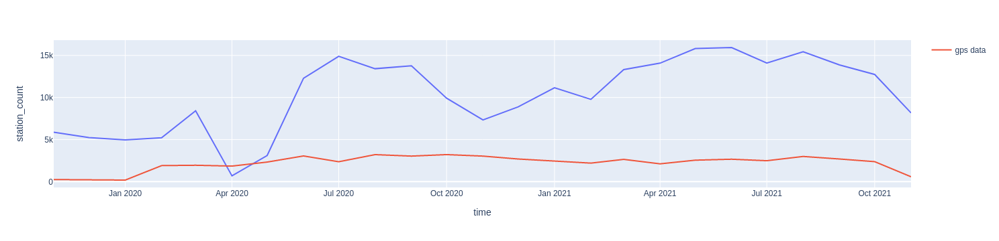

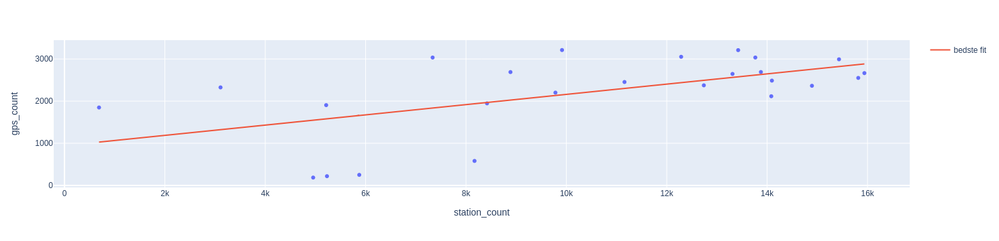

In [25]:
make_plots('eco_egehjorten', query_raw_routes)

station: eco_praestevang


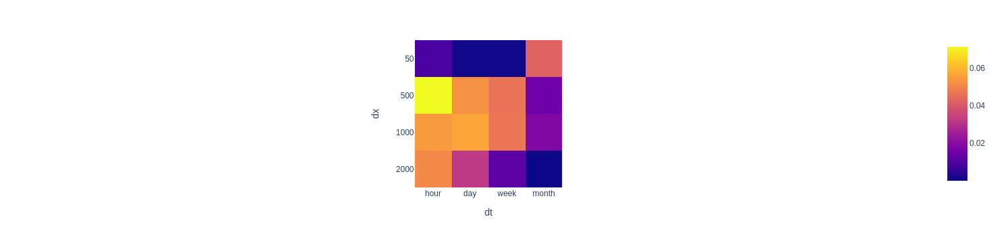

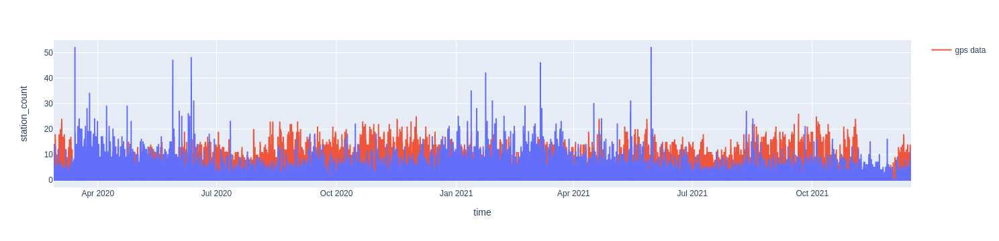

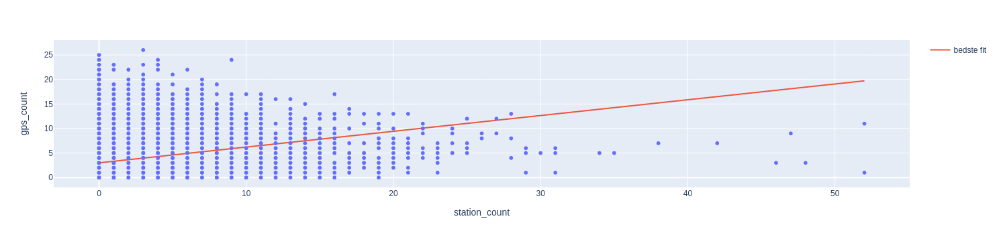

In [26]:
make_plots('eco_praestevang', query_raw_routes)

# Rengjorte ruter

station: onehour_32ed06


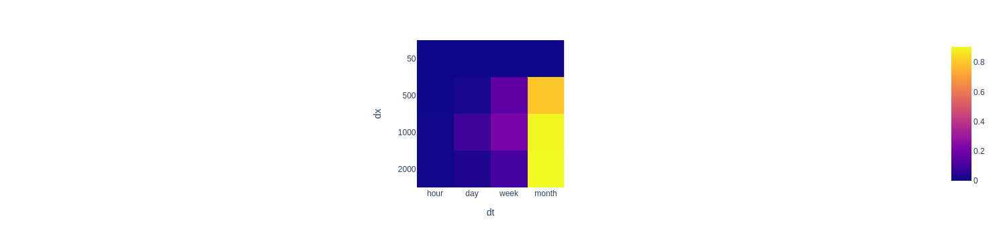

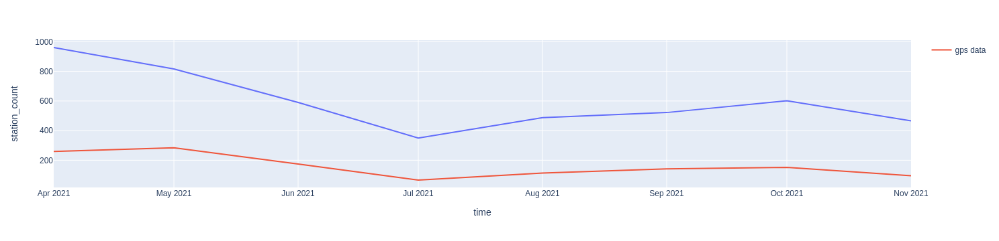

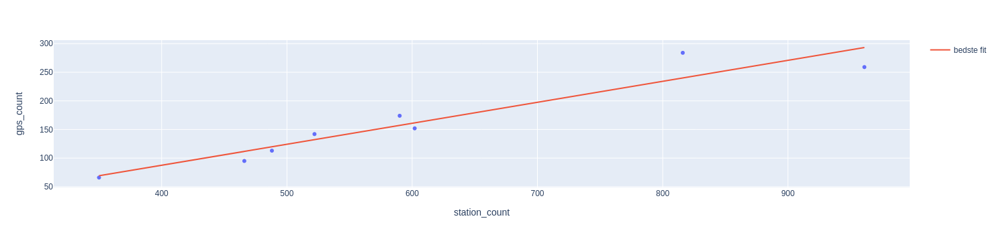

In [27]:
make_plots('onehour_32ed06', query_clean_routes)

station: onehour_302775


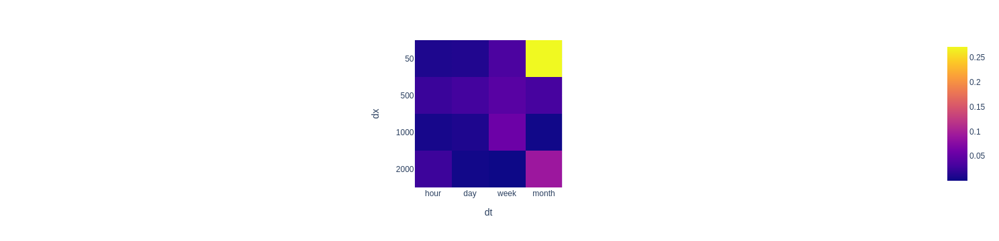

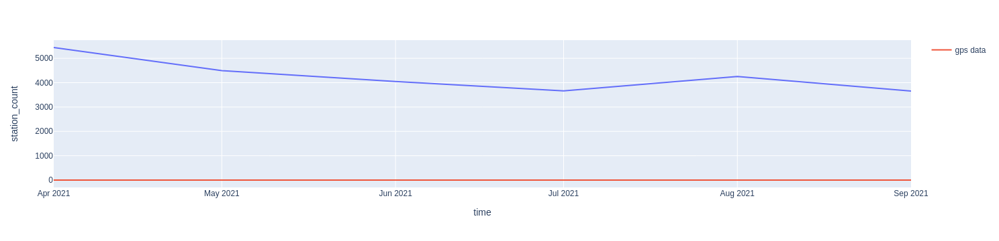

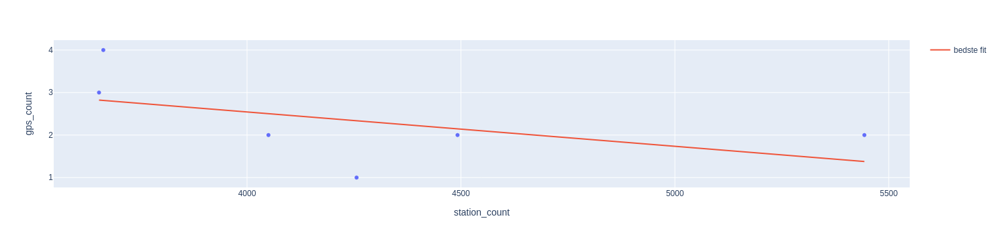

In [28]:
make_plots('onehour_302775', query_clean_routes)

station: onehour_30289c


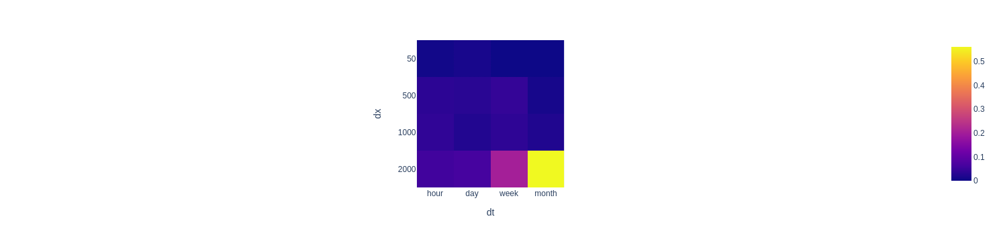

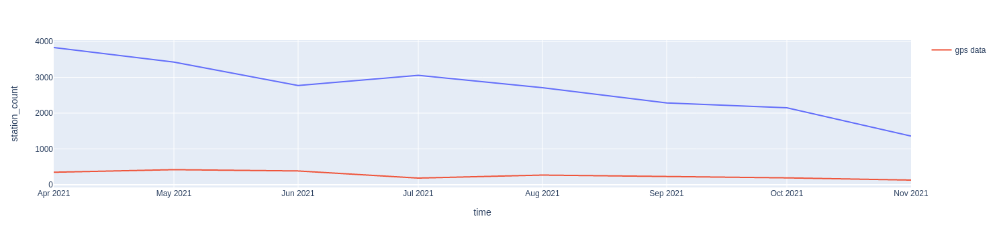

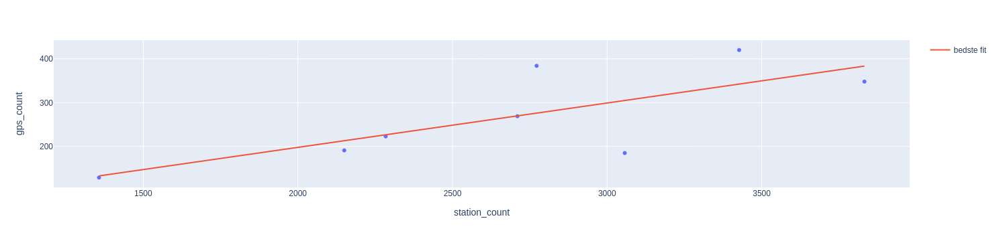

In [29]:
make_plots('onehour_30289c', query_clean_routes)

station: onehour_355853


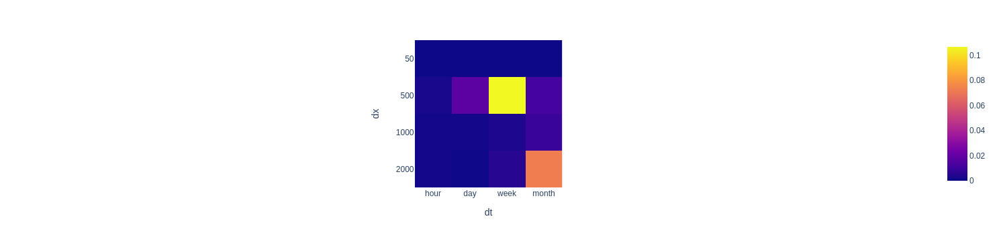

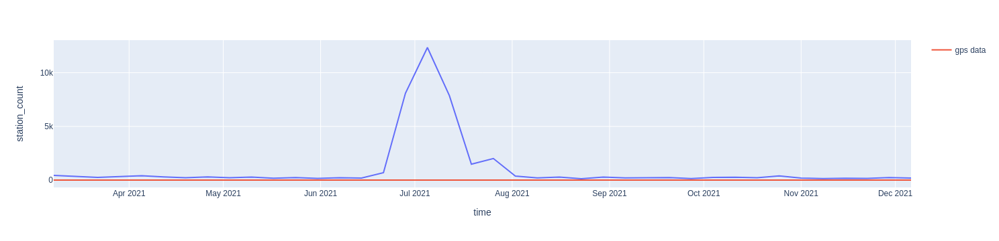

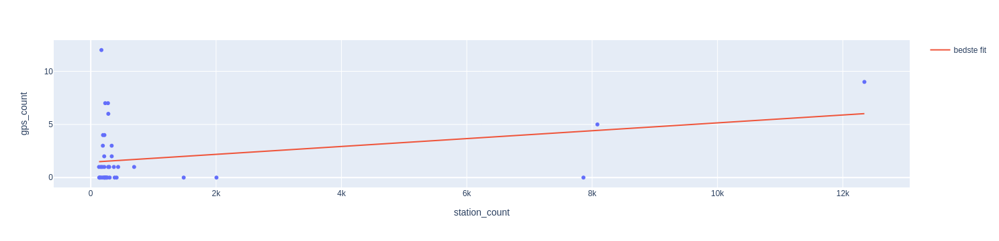

In [30]:
make_plots('onehour_355853', query_clean_routes)

station: onehour_3812a4


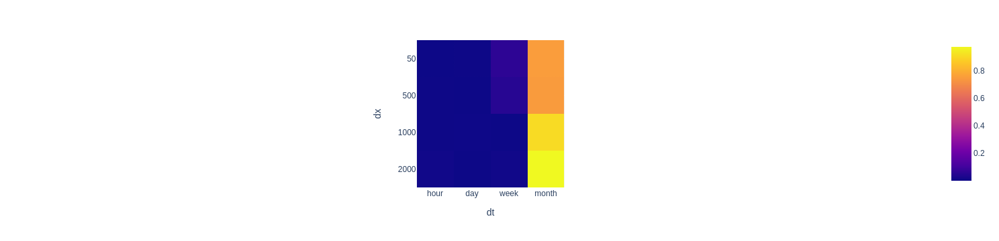

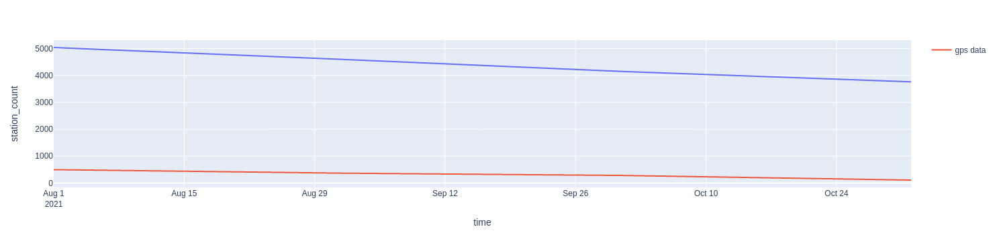

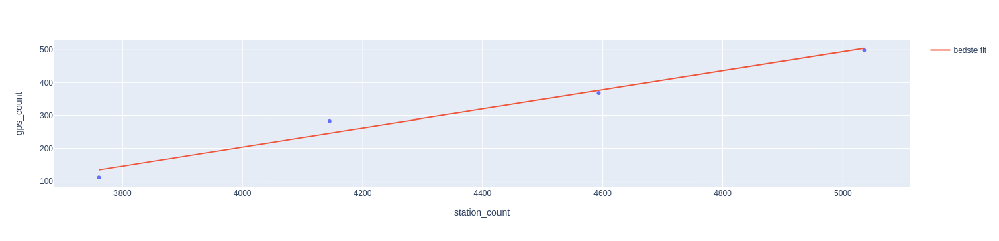

In [31]:
make_plots('onehour_3812a4', query_clean_routes)

station: eco_egehjorten


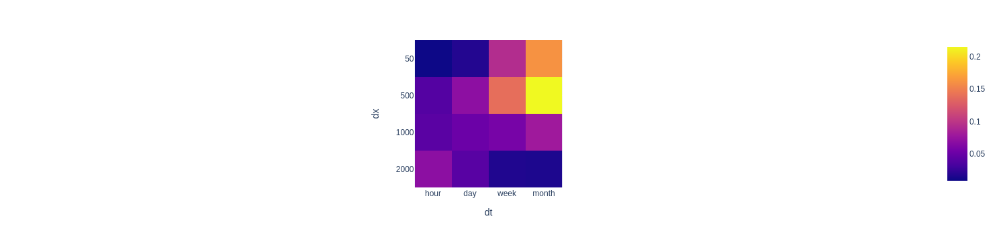

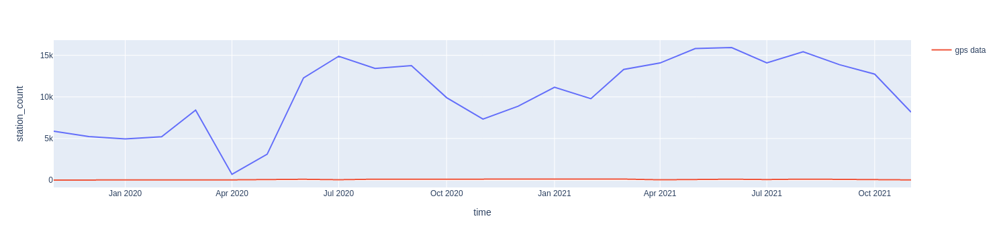

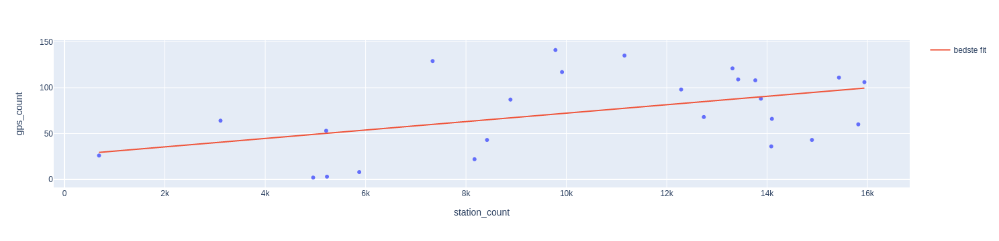

In [32]:
make_plots('eco_egehjorten', query_clean_routes)

station: eco_praestevang


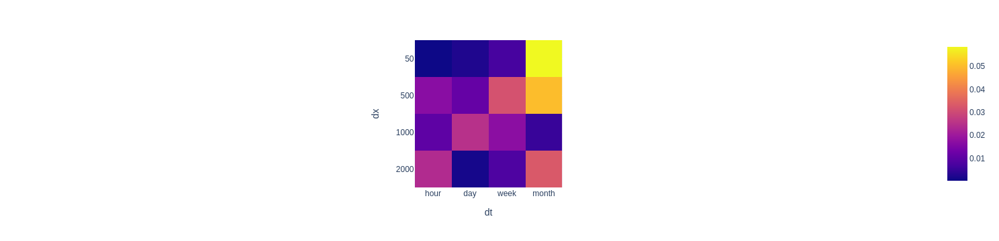

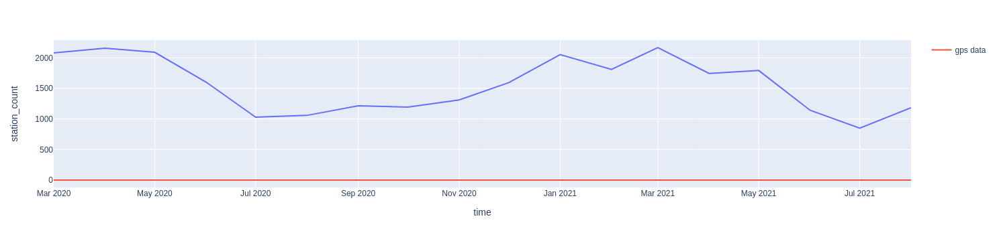

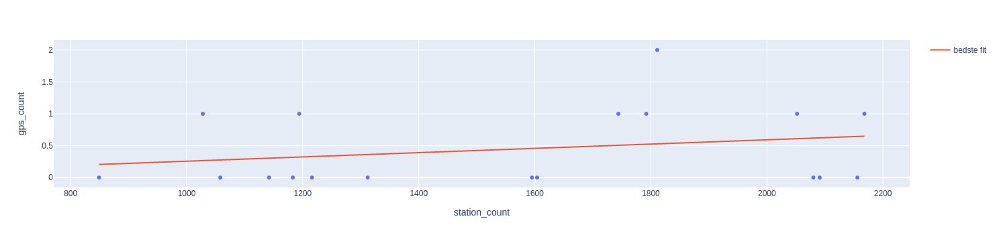

In [33]:
make_plots('eco_praestevang', query_clean_routes)